# SYNTHENTIC DATA PROJECT

FILENAME: synthetic_data.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 11-AUG-20

In [1]:
The purpose of this notebook is to create and replicate the core funtionalities of the 

SyntaxError: invalid syntax (<ipython-input-1-28afc7b5c7e1>, line 1)

## PHASE 1: PROJECT SETUP

In [ ]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_rca = 80 # can change the amount of RCAs
    num_of_programs = 120 # number of programs

    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    # create lists of each for each of the ordinal column values
    project_values = []
    subproject_values = []
    rca_values = []
    program_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['rca'] = rca_values
    raw_df['program_title'] = program_values

    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

Sankey visualization function - used to plot data located in the passed dataframe argument

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

Invoke the 'init_array' function in order to create a sample budgetary data set of 10,000 records

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-14,subproject-34,program-62,rca-35,10795,9468.39,11176.10,10220.80,6307.81,5612.76
9991,project-4,subproject-30,program-38,rca-52,18995,15810.51,16187.78,9978.77,9453.12,8429.00
9992,project-13,subproject-38,program-12,rca-8,12141,9976.12,10587.05,12974.29,9273.37,8580.50
9993,project-8,subproject-23,program-19,rca-76,6207,6425.40,6087.89,3830.80,3710.72,3239.75
9994,project-9,subproject-22,program-96,rca-7,9695,11470.09,10671.09,10530.01,12099.24,11712.45
9995,project-18,subproject-39,program-79,rca-41,17200,15202.41,12604.49,15486.06,13493.70,13391.54
9996,project-6,subproject-33,program-59,rca-6,18399,16913.66,16131.38,15069.83,17301.10,16833.99
9997,project-7,subproject-5,program-4,rca-15,9222,8251.54,7910.62,9434.40,8571.39,7647.98
9998,project-8,subproject-13,program-58,rca-20,6532,6270.82,6797.16,6859.35,4939.34,4776.30
9999,project-15,subproject-37,program-109,rca-1,20239,10615.57,9934.30,11680.85,8282.38,7580.66


Create a unique key based on the concatenation of the 'project', 'subproject', 'program_title', 'rca' column values

In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0        project-17-subproject-4-program-11-rca-20
1       project-20-subproject-38-program-57-rca-80
2        project-1-subproject-3-program-120-rca-30
3       project-18-subproject-32-program-12-rca-46
4       project-20-subproject-28-program-35-rca-32
                           ...                    
9995    project-18-subproject-39-program-79-rca-41
9996      project-6-subproject-33-program-59-rca-6
9997       project-7-subproject-5-program-4-rca-15
9998     project-8-subproject-13-program-58-rca-20
9999    project-15-subproject-37-program-109-rca-1
Name: key, Length: 10000, dtype: object

Remove duplicate rows as a way to mitigate collisions

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                            key
2461  project-9-subproject-15-program-19-rca-46
3032  project-19-subproject-7-program-24-rca-55
3240  project-3-subproject-30-program-68-rca-36
4728   project-3-subproject-2-program-20-rca-48
5889  project-6-subproject-31-program-12-rca-41
6141    project-4-subproject-2-program-67-rca-7
6916   project-4-subproject-3-program-62-rca-52
9093    project-5-subproject-8-program-35-rca-4
Total count of duplicated rows :
8


Dropping all duplicte 'key' values 

In [8]:
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique 'key' values in data structures

Create a list of all column names for future iteration activities

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

Create a list of unique project values

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-13', 'project-9', 'project-6', 'project-14', 'project-3', 'project-7', 'project-5', 'project-16', 'project-17', 'project-8', 'project-4', 'project-10', 'project-1', 'project-20', 'project-12', 'project-11', 'project-19', 'project-2', 'project-18', 'project-15'}


Create a list of subproject values

In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-1', 'subproject-30', 'subproject-14', 'subproject-28', 'subproject-11', 'subproject-26', 'subproject-27', 'subproject-18', 'subproject-37', 'subproject-21', 'subproject-33', 'subproject-10', 'subproject-4', 'subproject-15', 'subproject-36', 'subproject-40', 'subproject-22', 'subproject-39', 'subproject-3', 'subproject-16', 'subproject-24', 'subproject-25', 'subproject-32', 'subproject-17', 'subproject-9', 'subproject-2', 'subproject-6', 'subproject-20', 'subproject-34', 'subproject-5', 'subproject-38', 'subproject-8', 'subproject-19', 'subproject-31', 'subproject-13', 'subproject-29', 'subproject-23', 'subproject-7', 'subproject-35', 'subproject-12'}


Create a list of unique RCA values

In [15]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-5', 'rca-51', 'rca-15', 'rca-40', 'rca-13', 'rca-41', 'rca-77', 'rca-12', 'rca-20', 'rca-28', 'rca-71', 'rca-19', 'rca-66', 'rca-38', 'rca-26', 'rca-17', 'rca-14', 'rca-34', 'rca-56', 'rca-31', 'rca-70', 'rca-79', 'rca-3', 'rca-60', 'rca-75', 'rca-39', 'rca-50', 'rca-54', 'rca-65', 'rca-57', 'rca-80', 'rca-59', 'rca-68', 'rca-24', 'rca-10', 'rca-69', 'rca-4', 'rca-1', 'rca-45', 'rca-58', 'rca-8', 'rca-52', 'rca-72', 'rca-49', 'rca-53', 'rca-76', 'rca-61', 'rca-37', 'rca-30', 'rca-6', 'rca-9', 'rca-36', 'rca-11', 'rca-73', 'rca-29', 'rca-46', 'rca-35', 'rca-47', 'rca-55', 'rca-16', 'rca-74', 'rca-62', 'rca-22', 'rca-23', 'rca-43', 'rca-63', 'rca-32', 'rca-21', 'rca-78', 'rca-42', 'rca-67', 'rca-64', 'rca-7', 'rca-33', 'rca-18', 'rca-27', 'rca-25', 'rca-44', 'rca-48', 'rca-2'}


Create a list of unique program title values

In [16]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-59', 'program-106', 'program-35', 'program-20', 'program-84', 'program-105', 'program-26', 'program-87', 'program-88', 'program-48', 'program-78', 'program-60', 'program-107', 'program-29', 'program-21', 'program-64', 'program-65', 'program-52', 'program-30', 'program-14', 'program-27', 'program-92', 'program-68', 'program-91', 'program-56', 'program-42', 'program-63', 'program-95', 'program-19', 'program-33', 'program-102', 'program-82', 'program-38', 'program-55', 'program-58', 'program-86', 'program-37', 'program-53', 'program-100', 'program-73', 'program-77', 'program-117', 'program-62', 'program-12', 'program-101', 'program-114', 'program-111', 'program-17', 'program-110', 'program-118', 'program-69', 'program-116', 'program-49', 'program-9', 'program-104', 'program-71', 'program-1', 'program-79', 'program-47', 'program-10', 'program-40', 'program-23', 'program-6', 'program-3', 'program-109', 'program-67', 'program-24', 'program-4', 'program-119', 'program-25', 'program-

### Visualize the generated data set

'Project' Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name,  # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Summarized Budget at the Project, Subproject, RCA, and Program levels

Group by and sum project, subproject, RCA, program level obligation values

In [18]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

Utilize the Network X graph in order to depict relationships across the budget hiearchy

#### Project to Subproject network graph

In [19]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-17,subproject-4
1,project-20,subproject-38
2,project-1,subproject-3
3,project-18,subproject-32
4,project-20,subproject-28
...,...,...
9995,project-18,subproject-39
9996,project-6,subproject-33
9997,project-7,subproject-5
9998,project-8,subproject-13


Create the networkx object and plot

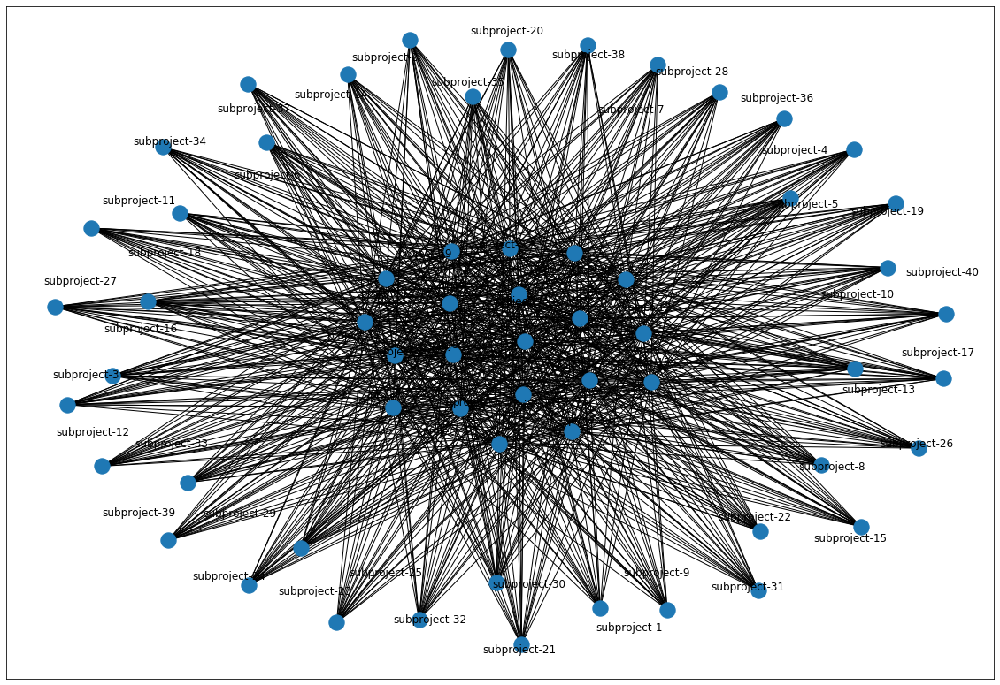

In [20]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [21]:
sum_df = train_df.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [22]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-4,program-11
1,subproject-38,program-57
2,subproject-3,program-120
3,subproject-32,program-12
4,subproject-28,program-35
...,...,...
9995,subproject-39,program-79
9996,subproject-33,program-59
9997,subproject-5,program-4
9998,subproject-13,program-58


Create the networkx object and plot

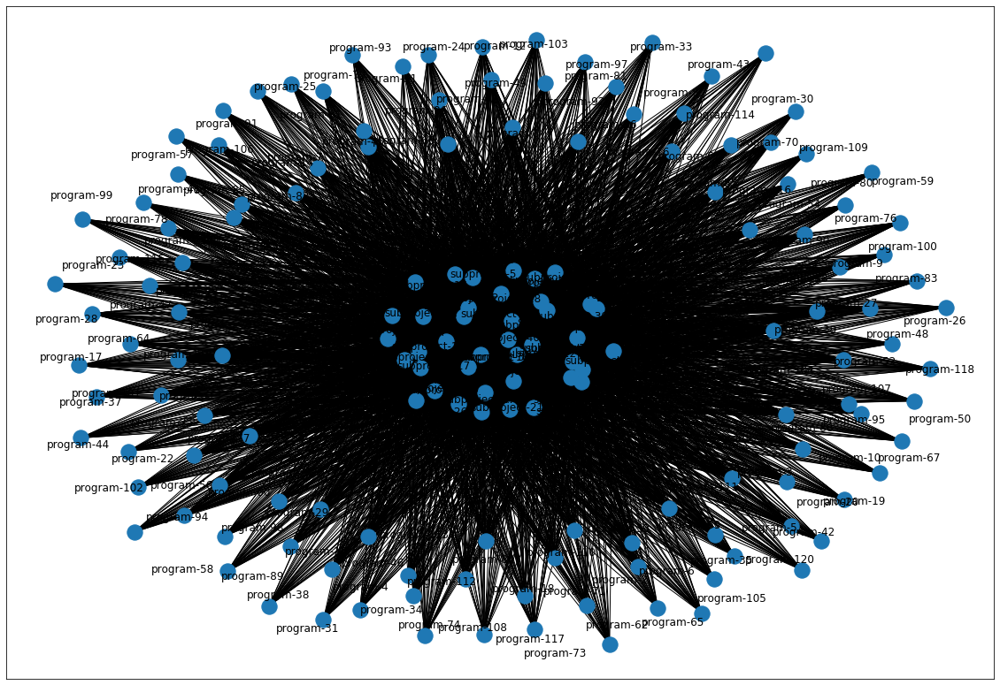

In [23]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

### Generate the sankey analysis 

Only retrieve the first 500 records

In [24]:
train_200 = train_df[:200].copy()

In [25]:
sum_df = train_200.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

Create a shallow copy of the completed 'train_df' dataframe in order to conducted stand alone financial execution data analysis

In [26]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-17,subproject-4,program-11,rca-20,27292,26561.27,25289.84,30257.89,18957.31,15372.83,project-17-subproject-4-program-11-rca-20
1,project-20,subproject-38,program-57,rca-80,20412,26065.27,30669.73,36028.73,24744.32,24283.81,project-20-subproject-38-program-57-rca-80
2,project-1,subproject-3,program-120,rca-30,1897,2031.95,2119.08,1829.41,1164.98,968.95,project-1-subproject-3-program-120-rca-30
3,project-18,subproject-32,program-12,rca-46,28022,30010.67,26507.05,24090.66,15238.11,13090.94,project-18-subproject-32-program-12-rca-46
4,project-20,subproject-28,program-35,rca-32,3324,3837.70,3122.83,3809.99,3410.59,3409.12,project-20-subproject-28-program-35-rca-32


Extract only the needed categorical columns

In [27]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice = exe_slice.rename(columns={'yr0_plan': "usd_value"})
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89
1,project-20-subproject-38-program-57-rca-80,project-20,subproject-38,program-57,rca-80,36028.73
2,project-1-subproject-3-program-120-rca-30,project-1,subproject-3,program-120,rca-30,1829.41
3,project-18-subproject-32-program-12-rca-46,project-18,subproject-32,program-12,rca-46,24090.66
4,project-20-subproject-28-program-35-rca-32,project-20,subproject-28,program-35,rca-32,3809.99


Assign year ending values to the dataframe

In [28]:
exe_slice['month'] = '12'
exe_slice['year'] = '2019'
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value,month,year
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019
1,project-20-subproject-38-program-57-rca-80,project-20,subproject-38,program-57,rca-80,36028.73,12,2019
2,project-1-subproject-3-program-120-rca-30,project-1,subproject-3,program-120,rca-30,1829.41,12,2019
3,project-18-subproject-32-program-12-rca-46,project-18,subproject-32,program-12,rca-46,24090.66,12,2019
4,project-20-subproject-28-program-35-rca-32,project-20,subproject-28,program-35,rca-32,3809.99,12,2019


Create a list of randomized obligated values for month ending 9-30-2019

In [29]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9019424724083509,
 0.9799886847434375,
 0.9216769155612604,
 0.9641122815735567,
 0.9506296802199706,
 0.9933191375595732,
 0.9706666961685663,
 0.9233691387378291,
 0.974156011176273,
 0.9489239033539907,
 0.9301044802342746,
 0.9847208020522893,
 0.9590256983514082,
 0.9860081421250215,
 0.946211170259933,
 0.9552480700869496,
 0.9630486908437571,
 0.9290270249126592,
 0.9431472598755479,
 0.933438192885041,
 0.9430460238660499,
 0.933632931463928,
 0.9759623356662734,
 0.9802088537594233,
 0.9031446476009499,
 0.9613935114897716,
 0.939466808944695,
 0.9801310319709812,
 0.9309485630079641,
 0.922181288197294,
 0.9616113257979877,
 0.9422802949741149,
 0.9506456007402699,
 0.9658778739718276,
 0.9556137605176069,
 0.9758611456372874,
 0.9928521171738209,
 0.9532969316827841,
 0.9102684256208435,
 0.9928640016227013,
 0.9298544167740376,
 0.9504420172157126,
 0.9761751795137595,
 0.9836416461684118,
 0.9611532233877104,
 0.9249538831855165,
 0.9082388435904989,
 0.9846714043432835

Calculate the end of year obligation values

In [30]:
exe_slice['oblig'] = exe_slice['usd_value'] * eoy_oblig
exe_slice

,key,project,subproject,program_title,rca,usd_value,month,year,oblig
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116
1,project-20-subproject-38-program-57-rca-80,project-20,subproject-38,program-57,rca-80,36028.73,12,2019,35307.747726
2,project-1-subproject-3-program-120-rca-30,project-1,subproject-3,program-120,rca-30,1829.41,12,2019,1686.124966
3,project-18-subproject-32-program-12-rca-46,project-18,subproject-32,program-12,rca-46,24090.66,12,2019,23226.101177
4,project-20-subproject-28-program-35-rca-32,project-20,subproject-28,program-35,rca-32,3809.99,12,2019,3621.889575
...,...,...,...,...,...,...,...,...,...
9995,project-18-subproject-39-program-79-rca-41,project-18,subproject-39,program-79,rca-41,15486.06,12,2019,14914.762853
9996,project-6-subproject-33-program-59-rca-6,project-6,subproject-33,program-59,rca-6,15069.83,12,2019,14045.156457
9997,project-7-subproject-5-program-4-rca-15,project-7,subproject-5,program-4,rca-15,9434.40,12,2019,8858.057393
9998,project-8-subproject-13-program-58-rca-20,project-8,subproject-13,program-58,rca-20,6859.35,12,2019,6382.946547


Create the execution burn rate percentages

In [31]:
eoy_exe = [random.uniform(0.6, .9) for x in range(df_len)]
eoy_exe

[0.8460311460914137,
 0.738319083478176,
 0.6626358877474013,
 0.674498717457396,
 0.6487152043395561,
 0.6953951345146927,
 0.7482391552711298,
 0.8024337109827772,
 0.7564162285012015,
 0.664249033227939,
 0.6607084591399472,
 0.7562995442533835,
 0.7059525359525799,
 0.8873552462555321,
 0.668615706845012,
 0.6222985311204389,
 0.8415032680129659,
 0.6451513078527561,
 0.8882085198414373,
 0.8171460439122753,
 0.7132303783605811,
 0.8510169094240476,
 0.6695951381885162,
 0.6894534976877257,
 0.8044508849310328,
 0.6183872819707018,
 0.6879702435835545,
 0.8552238417570551,
 0.6338876643800575,
 0.778821328935624,
 0.8061526894798369,
 0.7750600419885987,
 0.7966199842160949,
 0.8014800331887293,
 0.6925328218293657,
 0.878577533181592,
 0.8475060875604754,
 0.7992990955457774,
 0.6542705684332648,
 0.7408918117826282,
 0.8582733902427921,
 0.6591113178293835,
 0.85007463150829,
 0.8329608232803998,
 0.8429740401404433,
 0.6299154172668001,
 0.8513691862585329,
 0.7094274309916465,


Calculate the obligation and execution rates at the month level

In [32]:
exe_slice['total_authority'] = exe_slice['oblig']
exe_slice['executed'] = exe_slice['oblig'] * eoy_exe
exe_slice[:10]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
1,project-20-subproject-38-program-57-rca-80,project-20,subproject-38,program-57,rca-80,36028.73,12,2019,35307.747726,35307.747726,26068.383941
2,project-1-subproject-3-program-120-rca-30,project-1,subproject-3,program-120,rca-30,1829.41,12,2019,1686.124966,1686.124966,1117.286914
3,project-18-subproject-32-program-12-rca-46,project-18,subproject-32,program-12,rca-46,24090.66,12,2019,23226.101177,23226.101177,15665.975456
4,project-20-subproject-28-program-35-rca-32,project-20,subproject-28,program-35,rca-32,3809.99,12,2019,3621.889575,3621.889575,2349.574836
5,project-3-subproject-31-program-12-rca-17,project-3,subproject-31,program-12,rca-17,7051.50,12,2019,7004.389899,7004.389899,4870.818656
6,project-10-subproject-7-program-93-rca-10,project-10,subproject-7,program-93,rca-10,6063.31,12,2019,5885.453086,5885.453086,4403.726445
7,project-5-subproject-31-program-33-rca-12,project-5,subproject-31,program-33,rca-12,11148.88,12,2019,10294.531723,10294.531723,8260.679294
8,project-20-subproject-39-program-104-rca-74,project-20,subproject-39,program-104,rca-74,18948.62,12,2019,18458.912076,18458.912076,13962.620655
9,project-3-subproject-27-program-91-rca-18,project-3,subproject-27,program-91,rca-18,10024.36,12,2019,9512.354820,9512.354820,6318.572493


Create a list of 'key' values

In [33]:
key_list = list(exe_slice['key'])
key_list

['project-17-subproject-4-program-11-rca-20',
 'project-20-subproject-38-program-57-rca-80',
 'project-1-subproject-3-program-120-rca-30',
 'project-18-subproject-32-program-12-rca-46',
 'project-20-subproject-28-program-35-rca-32',
 'project-3-subproject-31-program-12-rca-17',
 'project-10-subproject-7-program-93-rca-10',
 'project-5-subproject-31-program-33-rca-12',
 'project-20-subproject-39-program-104-rca-74',
 'project-3-subproject-27-program-91-rca-18',
 'project-1-subproject-15-program-1-rca-43',
 'project-13-subproject-1-program-64-rca-67',
 'project-3-subproject-21-program-45-rca-20',
 'project-8-subproject-34-program-50-rca-33',
 'project-15-subproject-5-program-83-rca-65',
 'project-8-subproject-37-program-54-rca-9',
 'project-3-subproject-5-program-57-rca-73',
 'project-19-subproject-40-program-51-rca-22',
 'project-10-subproject-40-program-104-rca-4',
 'project-6-subproject-9-program-33-rca-56',
 'project-17-subproject-40-program-96-rca-29',
 'project-6-subproject-12-prog

In [34]:
exe_slice.dtypes

key                 object
project             object
subproject          object
program_title       object
rca                 object
usd_value          float64
month               object
year                object
oblig              float64
total_authority    float64
executed           float64
dtype: object

## Test one key for the timeseries for loop

Extract the first value from the master dataframe

In [35]:
temp = exe_slice[:1]
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199


Generate a dataframe with the newly added columns:
    
    1. executed - column to store executed EOM transactions
    2. total_authority - column to store total authority values for a given key (i.e. 'project-17-subproject-25-rca-43-program-28')

In [36]:
for month in range(11): # iterate through the remaining 11 months of the calendar year
    
    print("top of the loop")
    display(temp)
    current_month = 11 - month
    print("Current month: ", current_month)
    
    forward_month = int(current_month) + 1
    print("Forward month: ", forward_month)
    
    converted_month = str(forward_month)
    print("Converted month: ", converted_month)
    
    month_cond = temp['month'].str.startswith(converted_month, na=False) 

    temp_row = temp[month_cond]
    display(temp_row)
    #display(temp_row.iat[0,0])

    key_val = temp.iat[month,0]
    print(key_val)
    
    # assign the project value
    project_val = temp.iat[month,1]
    print(project_val)
    
    # assign the subproject value
    subproject_val = temp.iat[month,2]
    print(subproject_val)
    
    # assign the program value
    program_val = temp.iat[month,3]
    print(program_val)
    
    # assign the rca value
    rca_val = temp.iat[month,4]
    print(rca_val)
    
    # assign the forward month obligation value
    forward_oblig_val = temp.iat[month,8]
    print(forward_oblig_val)

    # assign the current month obligation value
    current_oblig_val = forward_oblig_val * .8
    print(current_oblig_val)
    
    # assign the forward month execution value
    forward_exe_val = temp.iat[month,10]
    print(forward_exe_val)

    # assign the current month execution value
    current_exe_val = forward_oblig_val * .7
    print(current_exe_val)
    
    ta_val = temp.iat[month,9]
    print(ta_val)

    usd_val = 0
    temp = temp.append(pd.DataFrame([[key_val,project_val,subproject_val,program_val,rca_val,usd_val, current_month, '2019', current_oblig_val,ta_val, current_exe_val]], columns=temp.columns))
    print('\nAdded row\n')

    

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
27290.876116459916
21832.700893167934
23088.931198647373
19103.61328152194
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
21832.700893167934
17466.160714534348
19103.61328152194
15282.890625217553
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
17466.160714534348
13972.928571627479
15282.890625217553
12226.312500174043
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
13972.928571627479
11178.342857301985
12226.312500174043
9781.050000139234
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
11178.342857301985
8942.674285841587
9781.050000139234
7824.840000111389
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
8942.674285841587
7154.13942867327
7824.840000111389
6259.872000089111
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
7154.13942867327
5723.311542938616
6259.872000089111
5007.897600071289
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,5,2019,5723.311543,27290.876116,5007.897600


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
5723.311542938616
4578.6492343508935
5007.897600071289
4006.3180800570312
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,5,2019,5723.311543,27290.876116,5007.897600
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,4,2019,4578.649234,27290.876116,4006.318080


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
4578.6492343508935
3662.919387480715
4006.3180800570312
3205.054464045625
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,5,2019,5723.311543,27290.876116,5007.897600
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,4,2019,4578.649234,27290.876116,4006.318080
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,3,2019,3662.919387,27290.876116,3205.054464


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
3662.919387480715
2930.335509984572
3205.054464045625
2564.0435712365006
27290.876116459916

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,5,2019,5723.311543,27290.876116,5007.897600
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,4,2019,4578.649234,27290.876116,4006.318080
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,3,2019,3662.919387,27290.876116,3205.054464


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-4-program-11-rca-20
project-17
subproject-4
program-11
rca-20
2930.335509984572
2344.2684079876576
2564.0435712365006
2051.2348569892006
27290.876116459916

Added row



Calculate utilization percentages

In [37]:
temp['oblig_ta_rate'] = temp['oblig'] / temp['total_authority']
temp['exe_ta_rate'] = temp['executed'] / temp['total_authority']
temp['exe_oblig_rate'] = temp['executed'] / temp['oblig']

temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed,oblig_ta_rate,exe_ta_rate,exe_oblig_rate
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199,1.000000,0.846031,0.846031
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,11,2019,21832.700893,27290.876116,19103.613282,0.800000,0.700000,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,10,2019,17466.160715,27290.876116,15282.890625,0.640000,0.560000,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,9,2019,13972.928572,27290.876116,12226.312500,0.512000,0.448000,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,8,2019,11178.342857,27290.876116,9781.050000,0.409600,0.358400,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,7,2019,8942.674286,27290.876116,7824.840000,0.327680,0.286720,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,6,2019,7154.139429,27290.876116,6259.872000,0.262144,0.229376,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,5,2019,5723.311543,27290.876116,5007.897600,0.209715,0.183501,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,4,2019,4578.649234,27290.876116,4006.318080,0.167772,0.146801,0.875000
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,0.00,3,2019,3662.919387,27290.876116,3205.054464,0.134218,0.117441,0.875000


Melt the quant columns to two columns, 'variable' and 'value'

In [38]:
plot_temp = temp[['month', 'oblig', 'total_authority', 'executed']].reset_index()
df_waterfall = pd.melt(plot_temp, id_vars=["month"], value_vars=["oblig", "total_authority", 'executed'])
df_waterfall[:10]

,month,variable,value
0,12,oblig,27290.876116
1,11,oblig,21832.700893
2,10,oblig,17466.160715
3,9,oblig,13972.928572
4,8,oblig,11178.342857
5,7,oblig,8942.674286
6,6,oblig,7154.139429
7,5,oblig,5723.311543
8,4,oblig,4578.649234
9,3,oblig,3662.919387


Sort the values by month and variable, descending

In [39]:
sorted_df = df_waterfall.sort_values(by=['month', 'variable'])
sorted_df[:10]

,month,variable,value
35,1,executed,2051.234857
11,1,oblig,2344.268408
23,1,total_authority,27290.876116
34,2,executed,2564.043571
10,2,oblig,2930.335510
22,2,total_authority,27290.876116
33,3,executed,3205.054464
9,3,oblig,3662.919387
21,3,total_authority,27290.876116
32,4,executed,4006.318080


Create the plotly chart

In [40]:

fig = px.bar(sorted_df, y='value', x='month', color = 'variable', title = "Execution, Obligation, and Total Authority Summary")
fig.update_layout(barmode='group')
fig.show()

### Visualize the utilization percentages at the RCA level

In [41]:
plot_temp = temp[['month', 'oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate']].reset_index()
df_util = pd.melt(plot_temp, id_vars=["month"], value_vars=['oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate'])
df_util[:10]

,month,variable,value
0,12,oblig_ta_rate,1.000000
1,11,oblig_ta_rate,0.800000
2,10,oblig_ta_rate,0.640000
3,9,oblig_ta_rate,0.512000
4,8,oblig_ta_rate,0.409600
5,7,oblig_ta_rate,0.327680
6,6,oblig_ta_rate,0.262144
7,5,oblig_ta_rate,0.209715
8,4,oblig_ta_rate,0.167772
9,3,oblig_ta_rate,0.134218


In [42]:
sorted_util = df_util.sort_values(by=['month', 'variable'])
sorted_util[:10]

,month,variable,value
35,1,exe_oblig_rate,0.875000
23,1,exe_ta_rate,0.075162
11,1,oblig_ta_rate,0.085899
34,2,exe_oblig_rate,0.875000
22,2,exe_ta_rate,0.093952
10,2,oblig_ta_rate,0.107374
33,3,exe_oblig_rate,0.875000
21,3,exe_ta_rate,0.117441
9,3,oblig_ta_rate,0.134218
32,4,exe_oblig_rate,0.875000


Plot the utilization rates for the given key

In [43]:
fig = px.line(sorted_util, y='value', x='month', color = 'variable', title = "Utilization Rate Summary for 'project-17-subproject-25-program-28-rca-43'", width=1000, height=700)

fig.update_layout(barmode='group')
fig.data[0].update(mode='markers+lines')
fig.data[1].update(mode='markers+lines')
fig.data[2].update(mode='markers+lines')

fig.show()

## Consolidated timeseries generated loop

In [44]:
temp2 = exe_slice.copy()
temp2[:5]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-4-program-11-rca-20,project-17,subproject-4,program-11,rca-20,30257.89,12,2019,27290.876116,27290.876116,23088.931199
1,project-20-subproject-38-program-57-rca-80,project-20,subproject-38,program-57,rca-80,36028.73,12,2019,35307.747726,35307.747726,26068.383941
2,project-1-subproject-3-program-120-rca-30,project-1,subproject-3,program-120,rca-30,1829.41,12,2019,1686.124966,1686.124966,1117.286914
3,project-18-subproject-32-program-12-rca-46,project-18,subproject-32,program-12,rca-46,24090.66,12,2019,23226.101177,23226.101177,15665.975456
4,project-20-subproject-28-program-35-rca-32,project-20,subproject-28,program-35,rca-32,3809.99,12,2019,3621.889575,3621.889575,2349.574836


# PHASE 4: EXPORT DATA

In [45]:
train_df.to_csv(r'locked_random_data_v1', index = False)

# END OF PROGRAM

"Si vacem para bellum"